Требуется отследить влияние условий жизни учащихся в возрасте от 15 до 22 лет на их успеваемость по математике, чтобы на ранней стадии выявлять студентов, находящихся в группе риска.
Задачей проекта является разведывательный анализ данных для модели, которая предсказывала бы результаты госэкзамена по математике для каждого ученика школы. 

In [1]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from scipy.stats import ttest_ind

# https://github.com/pandas-profiling/pandas-profiling
import pandas_profiling

%matplotlib inline
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows', 50)  # показывать больше строк
pd.set_option('display.max_columns', 50)  # показывать больше колонок

data = pd.read_csv('stud_math.csv')

In [2]:
# Функции предобработки

# Заполняем NaN наиболее часто встречающимся значением в столбце.
def fill_max_count_val(col):
    data_length = len(data[col])
    max_count_val = data[col].value_counts().idxmax()
    for x in range(0, data_length):
        if pd.isnull(data[col].iloc[x]):
            data[col].iloc[x] = max_count_val


# Заполняем NaN значением'other'.
def fill_other(col):
    data_length = len(data[col])
    for x in range(0, data_length):
        if pd.isnull(data[col].iloc[x]):
            data[col].iloc[x] = 'other'


# Проверка столбцов с булевыми значениями.
def check_bool(col):
    data_length = len(data[col])
    print('****** Столбец\033[1m', col, '\033[0m ******')
    if data[col].isnull().any():
        print('ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!')
    display(data[col].value_counts())
    display(data[col].describe())
    for x in range(0, data_length):
        if pd.isnull(data[col].iloc[x]) or (data[col].iloc[x] == 'yes') or (data[col].iloc[x] == 'no'):
            continue
        else:
            print('ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ НЕДОПУСТИМЫЕ ЗНАЧЕНИЯ!',
                  data[col].iloc[x])


# Проверка столбцов с рейтингом от 1 до 5.
def check_rating(col):
    len_data = 389
    print('****** Столбец\033[1m', col, '\033[0m ******')
    if data[col].isnull().any():
        print('ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!')
    display(data[col].value_counts())
    display(data[col].describe())
    for x in range(0, len_data):
        if pd.isnull(data[col].iloc[x]) or ((data[col].iloc[x] > 0) and (data[col].iloc[x] <= 5)):
            continue
        else:
            print('ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ НЕДОПУСТИМОЕ ЗНАЧЕНИЕ!',
                  data[col].iloc[x], '\n\n\n')


# Рисуем boxplot для категориальных и булевых переменных.
def get_boxplot(column):
    fig, ax = plt.subplots(figsize=(14, 4))
    sns.boxplot(x=column, y='score',
                data=data.loc[data.loc[:, column].isin(
                    data.loc[:, column].value_counts().index[:10])],
                ax=ax)
    plt.xticks(rotation=45)
    ax.set_title('Boxplot for ' + column)
    plt.show()


# Проверяем данные с помощью теста Стьюдента.
def get_stat_dif(column):
    cols = data.loc[:, column].value_counts().index[:10]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        if ttest_ind(data.loc[data.loc[:, column] == comb[0], 'score'],
                     data.loc[data.loc[:, column] == comb[1], 'score']).pvalue \
                <= 0.05/len(combinations_all):
            print('Найдены статистически значимые различия для колонки', column)
            break

In [3]:
display(data.sample(100))
data.info()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,"studytime, granular",higher,internet,romantic,famrel,freetime,goout,health,absences,score
78,GP,M,17,U,NaN,T,2.0,1.0,other,other,home,mother,2.0,1.0,3.0,yes,NaN,no,yes,yes,-3.0,no,yes,no,4.0,5.0,1.0,3.0,2.0,50.0
353,MS,M,19,R,GT3,T,1.0,1.0,other,other,home,other,3.0,1.0,1.0,no,yes,no,no,yes,-3.0,yes,yes,no,4.0,4.0,4.0,5.0,4.0,40.0
73,GP,M,16,U,GT3,T,3.0,1.0,other,other,NaN,mother,1.0,1.0,0.0,no,no,no,yes,yes,-3.0,yes,no,no,NaN,3.0,2.0,5.0,2.0,70.0
82,GP,F,15,U,LE3,T,3.0,2.0,services,other,reputation,mother,1.0,2.0,0.0,no,yes,NaN,no,yes,-6.0,yes,yes,no,4.0,4.0,4.0,5.0,10.0,30.0
188,GP,F,17,U,GT3,A,3.0,3.0,health,other,reputation,mother,1.0,2.0,0.0,no,yes,no,no,no,-6.0,yes,yes,yes,3.0,3.0,3.0,3.0,6.0,45.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,GP,M,17,R,GT3,T,2.0,2.0,other,other,course,father,2.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,4.0,5.0,2.0,1.0,4.0,55.0
110,GP,M,15,U,LE3,A,4.0,4.0,teacher,teacher,course,mother,1.0,1.0,0.0,no,no,no,yes,yes,-3.0,yes,NaN,no,5.0,5.0,3.0,4.0,6.0,95.0
91,GP,F,15,U,GT3,T,4.0,3.0,services,other,reputation,mother,1.0,NaN,NaN,no,no,yes,yes,yes,NaN,yes,yes,no,4.0,5.0,5.0,1.0,4.0,90.0
20,GP,M,15,U,GT3,T,4.0,3.0,teacher,other,reputation,mother,1.0,2.0,0.0,no,no,no,no,yes,-6.0,yes,yes,no,NaN,4.0,1.0,1.0,0.0,75.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   school               395 non-null    object 
 1   sex                  395 non-null    object 
 2   age                  395 non-null    int64  
 3   address              378 non-null    object 
 4   famsize              368 non-null    object 
 5   Pstatus              350 non-null    object 
 6   Medu                 392 non-null    float64
 7   Fedu                 371 non-null    float64
 8   Mjob                 376 non-null    object 
 9   Fjob                 359 non-null    object 
 10  reason               378 non-null    object 
 11  guardian             364 non-null    object 
 12  traveltime           367 non-null    float64
 13  studytime            388 non-null    float64
 14  failures             373 non-null    float64
 15  schoolsup            386 non-null    obj

В нашем датасете есть следующие поля:

1 school — аббревиатура школы, в которой учится ученик

2 sex — пол ученика ('F' - женский, 'M' - мужской)

3 age — возраст ученика (от 15 до 22)

4 address — тип адреса ученика ('U' - городской, 'R' - за городом)

5 famsize — размер семьи('LE3' <= 3, 'GT3' >3)

6 Pstatus — статус совместного жилья родителей ('T' - живут вместе 'A' - раздельно)

7 Medu — образование матери (0 - нет, 1 - 4 класса, 2 - 5-9 классы, 3 - среднее специальное или 11 классов, 4 - высшее)

8 Fedu — образование отца (0 - нет, 1 - 4 класса, 2 - 5-9 классы, 3 - среднее специальное или 11 классов, 4 - высшее)

9 Mjob — работа матери ('teacher' - учитель, 'health' - сфера здравоохранения, 'services' - гос служба, 'at_home' - не работает, 'other' - другое)

10 Fjob — работа отца ('teacher' - учитель, 'health' - сфера здравоохранения, 'services' - гос служба, 'at_home' - не работает, 'other' - другое)

11 reason — причина выбора школы ('home' - близость к дому, 'reputation' - репутация школы, 'course' - образовательная программа, 'other' - другое)

12 guardian — опекун ('mother' - мать, 'father' - отец, 'other' - другое)

13 traveltime — время в пути до школы (1 - <15 мин., 2 - 15-30 мин., 3 - 30-60 мин., 4 - >60 мин.)

14 studytime — время на учёбу помимо школы в неделю (1 - <2 часов, 2 - 2-5 часов, 3 - 5-10 часов, 4 - >10 часов)

15 failures — количество внеучебных неудач (n, если 1<=n<=3, иначе 0)

16 schoolsup — дополнительная образовательная поддержка (yes или no)

17 famsup — семейная образовательная поддержка (yes или no)

18 paid — дополнительные платные занятия по математике (yes или no)

19 activities — дополнительные внеучебные занятия (yes или no)

20 nursery — посещал детский сад (yes или no)

21 higher — хочет получить высшее образование (yes или no)

22 internet — наличие интернета дома (yes или no)

23 romantic — в романтических отношениях (yes или no)

24 famrel — семейные отношения (от 1 - очень плохо до 5 - очень хорошо)

25 freetime — свободное время после школы (от 1 - очень мало до 5 - очень мого)

26 goout — проведение времени с друзьями (от 1 - очень мало до 5 - очень много)

27 health — текущее состояние здоровья (от 1 - очень плохо до 5 - очень хорошо)

28 absences — количество пропущенных занятий

29 score — баллы по госэкзамену по математике

In [4]:
data.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'studytime, granular', 'higher', 'internet', 'romantic', 'famrel',
       'freetime', 'goout', 'health', 'absences', 'score'],
      dtype='object')

Как видим, у нас в базе есть один столбец, которого нет в описании полей. Далее попробуем выяснить что в нем содержится.

In [5]:
# переименуем столбцы в удобную для работы форму
data.columns = ['school', 'sex', 'age', 'address', 'famsize', 'pstatus', 'medu', 'fedu', 'mjob', 'fjob', 'reason', 'guardian', 'traveltime', 'studytime', 'failures',
                'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'studytime_granular', 'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'health', 'absences', 'score']

In [6]:
# https://github.com/pandas-profiling/pandas-profiling
# Используем библиотеку для быстрого анализа информации.
pandas_profiling.ProfileReport(data)

In [7]:
# Посмотрим наличие и количество пустых значений в каждом из столбцов
data.isna().sum()

school                 0
sex                    0
age                    0
address               17
famsize               27
pstatus               45
medu                   3
fedu                  24
mjob                  19
fjob                  36
reason                17
guardian              31
traveltime            28
studytime              7
failures              22
schoolsup              9
famsup                39
paid                  40
activities            14
nursery               16
studytime_granular     7
higher                20
internet              34
romantic              31
famrel                27
freetime              11
goout                  8
health                15
absences              12
score                  6
dtype: int64

<AxesSubplot:>

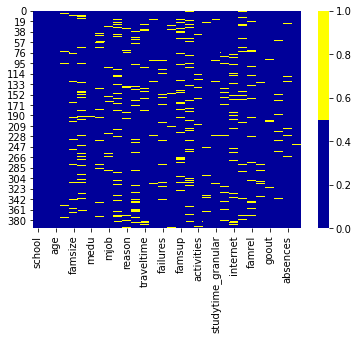

In [8]:
# Построим тепловую карту пустых значений для визуальной оценки
colours = ['#000099', '#ffff00']
sns.heatmap(data.isnull(), cmap=sns.color_palette(colours))

In [9]:
# Cтолбец studytime_granular полностью коррелируется со столбцом studytime, поэтому удалим один из столбцов.
data.drop('studytime_granular', axis=1, inplace=True)

Рассмотрим столбец с целевой переменной.
В столбце, содержащей целевую переменную есть строки с отсутствующими значениями - NaN.
Т.к. мы собираемся строить модель для прогнозирования score (баллов по математике), постараемся не менять набор данных (не будем заполнять сгенерированными значениями), чтобы не приходить к ошибочным гипотезам. Пустых значений не очень много, поэтому лучше удалим из датасета строки, содержащие NaN в столбце score.

In [10]:
data.score

0      30.0
1      30.0
2      50.0
3      75.0
4      50.0
       ... 
390    45.0
391    80.0
392    35.0
393    50.0
394    45.0
Name: score, Length: 395, dtype: float64

In [11]:
# Удаляем строки, содержащие NaN в столбце score.
data = data.dropna(axis='index', how='any', subset=['score'])

count    389.000000
mean      52.262211
std       22.919022
min        0.000000
25%       40.000000
50%       55.000000
75%       70.000000
max      100.000000
Name: score, dtype: float64

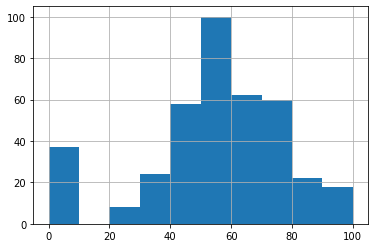

In [12]:
# Посмотрим гистограму распределения, для визуального контроля данных, а также основные статистические параметры.
data.score.hist()
data.score.describe()

В результате анализа данных в столбце score, аномальных значений и выбросов не обнаружено. Все значения содержатся в допустимом диапазоне. Возникают вопросы по поводу нулевых значений, но это, скорее всего, оценка тех школьников, которые не явились на экзамен. Возможно, в дальнейшем придется строить отдельную модель для предсказания явки школьника на экзамен.
Распределение успеваемости - нормальное. Экстремально низкие и экстремально высокие баллы получило оносительно немного школьников. Большая часть учащихся - получила средние показатели.
Перейдем к анализу остальных столбцов датасета.

GP    344
MS     45
Name: school, dtype: int64

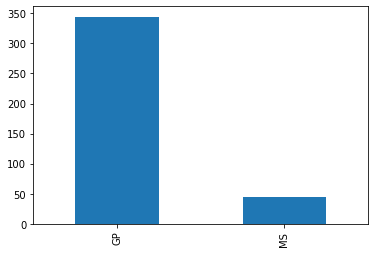

In [13]:
# Изучим данные в столбце school
data.school.value_counts().plot.bar()
display(data.school.value_counts())

Столбец содержит в себе данные о школе, в которой учится ученик. Пропусков в этом столбце нет. Датасет содержит данные об учащихся из двух школ, при этом группы участников разделены по школам неравномерно. Большая часть учеников учится в школе с аббревиатурой GP.

F    204
M    185
Name: sex, dtype: int64

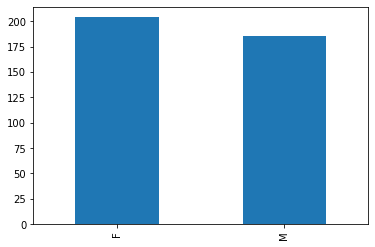

In [14]:
# Изучим данные в столбце sex
data.sex.value_counts().plot.bar()
display(data.sex.value_counts())

Столбец содержит в себе данные о распределении по полу. Распределение примерно равномерное с небольшим перевесом учащихся женского пола. Пропусков в этом столбце нет.

16    103
17     98
15     82
18     80
19     21
20      3
22      1
21      1
Name: age, dtype: int64

count    389.000000
mean      16.673522
std        1.265662
min       15.000000
25%       16.000000
50%       17.000000
75%       18.000000
max       22.000000
Name: age, dtype: float64

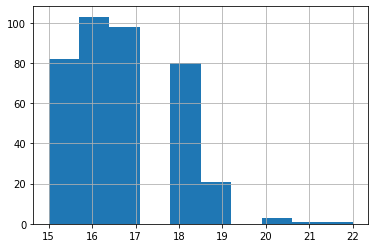

In [15]:
# Изучим данные в столбце age
data.age.hist()
display(data.age.value_counts())
display(data.age.describe())

Столбец содержит в себе данные о распределении по возрасту. Пропусков в этом столбце нет. Все значения содержатся в допустимом диапазоне. Большая часть учащихся - в нижнем диапазоне возрастной группы.

U    291
R     83
Name: address, dtype: int64

count     374
unique      2
top         U
freq      291
Name: address, dtype: object

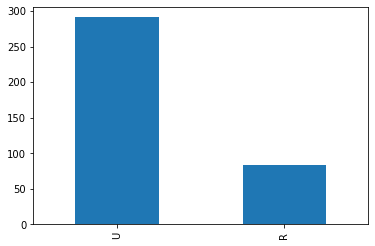

In [16]:
# Изучим данные в столбце address — тип адреса ученика ('U' - городской, 'R' - за городом).
data.address.value_counts().plot.bar()
display(data.address.value_counts())
display(data.address.describe())

Большая часть учащихся проживает в черте города. К сожалению, столбец содержит пропуски.
Подумаем, как их минимизировать.
Предополжим, что те ученики, которые живут в черте города, тратят меньше время на путь до школы. 
Таким образом, можно заполнить столбец address значениями, опираясь на столбец traveltime (и наоборот).

1.0    239
2.0     94
3.0     21
4.0      7
Name: traveltime, dtype: int64

count    361.000000
mean       1.434903
std        0.692660
min        1.000000
25%        1.000000
50%        1.000000
75%        2.000000
max        4.000000
Name: traveltime, dtype: float64

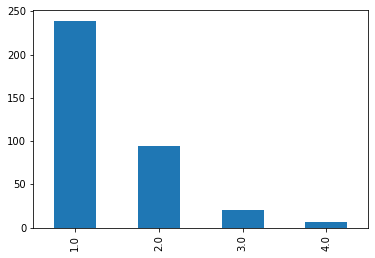

In [17]:
# Изучим данные в столбце traveltime — время в пути до школы (1 - <15 мин., 2 - 15-30 мин., 3 - 30-60 мин., 4 - >60 мин.)
data.traveltime.value_counts().plot.bar()
display(data.traveltime.value_counts())
display(data.traveltime.describe())

К сожалению, столбец traveltime также содержит пропуски. Попробуем заполнить пропуски в столбцах address и traveltime, воспользовавшись очевидной зависимостью между типом адреса ученика и временем в пути до школы.
Примем, что, в случае:
1. Если столбец traveltime содержит значение 1 или 2 - соответствующая строка (с пропуском) в столбце address заполняется значением U. 
2. Если столбец traveltime содержит значение 3 или 4 - соответствующая строка (с пропуском) в столбце address заполняется значением R. 
3. Если столбец address содержит значение U - соответствующая строка (с пропуском) в столбце traveltime заполняется значением 2.
4. Если столбец address содержит значение R - соответствующая строка (с пропуском) в столбце traveltime заполняется значением 3.

In [18]:
def addres_to_traveltime(column1, column2):
    data_length = len(data[column1])
    # В случае, если NaN содержится и в address, и в traveltime - устанавливаем значения в U и 2.0 соответственно.
    for x in range(0, data_length):
        if pd.isnull(data[column1].iloc[x]) and pd.isnull(data[column2].iloc[x]):
            data[column1].iloc[x] = 'U'
            data[column2].iloc[x] = 2.0
    # Устанавливаем значения в столбце address в зависимости от значений в traveltime
        if pd.isnull(data[column1].iloc[x]):
            if data[column2].iloc[x] == 2.0 or data[column2].iloc[x] == 1.0:
                data[column1].iloc[x] = 'U'
            elif data[column2].iloc[x] == 3.0 or data[column2].iloc[x] == 4.0:
                data[column1].iloc[x] = 'R'
    # Устанавливаем значения в столбце traveltime в зависимости от значений в address
        elif pd.isnull(data[column2].iloc[x]):
            if data[column1].iloc[x] == 'U':
                data[column2].iloc[x] = 2.0
            elif data[column1].iloc[x] == 'R':
                data[column2].iloc[x] = 3.0


addres_to_traveltime('address', 'traveltime')

In [19]:
display(data.address.value_counts())
display(data.address.describe())

U    306
R     83
Name: address, dtype: int64

count     389
unique      2
top         U
freq      306
Name: address, dtype: object

In [20]:
display(data.traveltime.value_counts())
display(data.traveltime.describe())

1.0    239
2.0    115
3.0     28
4.0      7
Name: traveltime, dtype: int64

count    389.000000
mean       1.493573
std        0.709352
min        1.000000
25%        1.000000
50%        1.000000
75%        2.000000
max        4.000000
Name: traveltime, dtype: float64

После применения функции addres_to_traveltime, в столбцах address и traveltime пустых значений нет.

GT3    255
LE3    107
Name: famsize, dtype: int64

count     362
unique      2
top       GT3
freq      255
Name: famsize, dtype: object

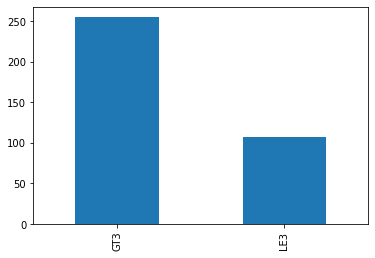

In [21]:
# Изучим данные в столбце famsize — размер семьи('LE3' <= 3, 'GT3' >3).
data.famsize.value_counts().plot.bar()
display(data.famsize.value_counts())
display(data.famsize.describe())

Большая часть учащихся проживает в семьях с количеством человек более 3. К сожалению, столбец содержит пропуски. 
Предополжим, что те ученики, родители которых проживают совместно (значение 'T' в столбце Pstatus) с большей веротяностью проживают в семье с количеством человек более 3. Примем, что: 
1. Если столбец Pstatus содержит значение T - соответствующая строка (с пропуском) в столбце famsize заполняется значением GT3.
2. Если столбец Pstatus содержит значение А - соответствующая строка (с пропуском) в столбце famsize заполняется значением LE3.
3. Если столбец Pstatus содержит значение NaN - соответствующая строка (с пропуском) в столбце famsize заполняется наиболее частотным значением GT3.

In [22]:
def famsize_to_pstatus(column1, column2):
    data_length = len(data[column1])
    for x in range(0, data_length):
        if pd.isnull(data[column1].iloc[x]):
            # Устанавливаем значения в столбце famsize в зависимости от значений в pstatus.
            if data[column2].iloc[x] == 'T':
                data[column1].iloc[x] = 'GT3'
            elif data[column2].iloc[x] == 'A':
                data[column1].iloc[x] = 'LE3'
            # В случае, если NaN содержится и в famsize, и в pstatus - устанавливаем значение в GT3.
            elif pd.isnull(data[column2].iloc[x]):
                data[column1].iloc[x] = 'GT3'


famsize_to_pstatus('famsize', 'pstatus')

In [23]:
display(data.famsize.value_counts())
display(data.famsize.describe())

GT3    279
LE3    110
Name: famsize, dtype: int64

count     389
unique      2
top       GT3
freq      279
Name: famsize, dtype: object

После применения функции famsize_to_pstatus, в столбце famsize пустых значений нет.

T    308
A     36
Name: pstatus, dtype: int64

count     344
unique      2
top         T
freq      308
Name: pstatus, dtype: object

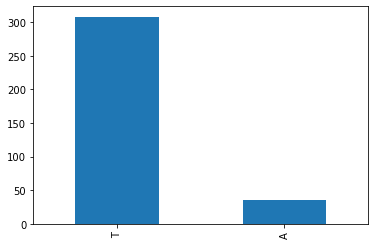

In [24]:
# Изучим данные в столбце pstatus — статус совместного жилья родителей ('T' - живут вместе 'A' - раздельно).
data.pstatus.value_counts().plot.bar()
display(data.pstatus.value_counts())
display(data.pstatus.describe())

Большая часть учащихся проживает в семьях с совместно проживающими родителями. К сожалению, столбец содержит пропуски. 
Предополжим, что те ученики, которые имеют неопределенного опекуна ('other' в столбце guardian) с большей веротяностью проживают в семье с раздельно проживающими родителями. Примем, что: 
1. Если столбец guardian содержит значение 'other' - соответствующая строка (с пропуском) в столбце pstatus заполняется значением А.
2. Если столбец guardian содержит значение, отличное от 'other' - соответствующая строка (с пропуском) в столбце pstatus заполняется наиболее частотным значением Т.

In [25]:
def pstatus_to_guardian(column1, column2):
    data_length = len(data[column1])
    for x in range(0, data_length):
        if pd.isnull(data[column1].iloc[x]):
            # Устанавливаем значения в столбце pstatus в зависимости от значений в guardian.
            if data[column2].iloc[x] == 'other':
                data[column1].iloc[x] = 'A'
            else:
                data[column1].iloc[x] = 'T'


pstatus_to_guardian('pstatus', 'guardian')

In [26]:
display(data.pstatus.value_counts())
display(data.pstatus.describe())

T    349
A     40
Name: pstatus, dtype: int64

count     389
unique      2
top         T
freq      349
Name: pstatus, dtype: object

После применения функции pstatus_to_guardian, в столбце pstatus пустых значений нет.

4.0    131
2.0    100
3.0     96
1.0     56
0.0      3
Name: medu, dtype: int64

count    386.000000
mean       2.766839
std        1.094277
min        0.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: medu, dtype: float64

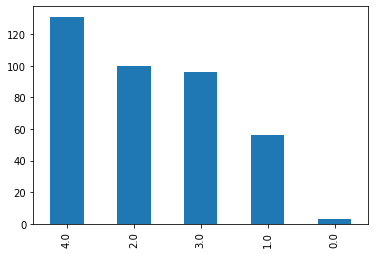

In [27]:
# Изучим данные в столбце medu — образование матери (0 - нет, 1 - 4 класса, 2 - 5-9 классы, 3 - среднее специальное или 11 классов, 4 - высшее)
data.medu.value_counts().plot.bar()
display(data.medu.value_counts())
display(data.medu.describe())

Матери большинства учеников имеют высшее образование, далее примерно одинаковое количество матерей имеют среднеспециальное образование или заканчивали только 5-9 классы. К сожалению, в столбце есть пропуски, хотя их и немного.
Заполним пропуски наиболее часто встречающимся значением - в данном случае значением 4.

In [28]:
fill_max_count_val('medu')
display(data.medu.value_counts())
display(data.medu.describe())

4.0    134
2.0    100
3.0     96
1.0     56
0.0      3
Name: medu, dtype: int64

count    389.000000
mean       2.776350
std        1.095377
min        0.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: medu, dtype: float64

После применения функции fill_max_count_val, в столбце medu пустых значений нет.

2.0     105
3.0      94
4.0      88
1.0      75
0.0       2
40.0      1
Name: fedu, dtype: int64

count    365.000000
mean       2.627397
std        2.241790
min        0.000000
25%        2.000000
50%        3.000000
75%        3.000000
max       40.000000
Name: fedu, dtype: float64

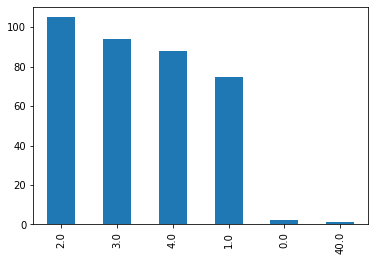

In [29]:
# Изучим данные в столбце fedu — образование отца (0 - нет, 1 - 4 класса, 2 - 5-9 классы, 3 - среднее специальное или 11 классов, 4 - высшее)
data.fedu.value_counts().plot.bar()
display(data.fedu.value_counts())
display(data.fedu.describe())

Отцы большинтва учащихся имеют образование 5-9 классов.
В этом столбце, кроме пустых значений, мы также наблюдаем один выброс со значением 40.
Скорее всего это опечатка и на самом деле в этой ячейке должно быть значение 4.
Исправим ситуацию с выбросом, после чего заполним пропуски наиболее часто встречающимся значением - в данном случае значением 2.

In [30]:
data.loc[data['fedu'] == 40.0]['fedu'] = 4.0
fill_max_count_val('fedu')
display(data.fedu.value_counts())
display(data.fedu.describe())

2.0     129
3.0      94
4.0      88
1.0      75
0.0       2
40.0      1
Name: fedu, dtype: int64

count    389.000000
mean       2.588689
std        2.176604
min        0.000000
25%        2.000000
50%        2.000000
75%        3.000000
max       40.000000
Name: fedu, dtype: float64

Выбросы и пустые значения в столбце fedu - отсутствуют.

other       127
services     98
at_home      58
teacher      55
health       32
Name: mjob, dtype: int64

count       370
unique        5
top       other
freq        127
Name: mjob, dtype: object

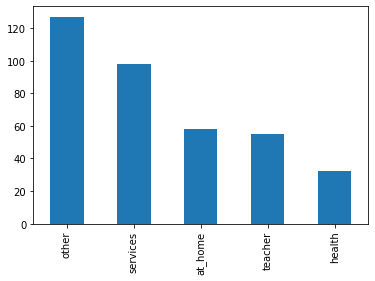

In [31]:
# Изучим данные в столбце mjob — работа матери ('teacher' - учитель, 'health' - сфера здравоохранения, 'services' - гос служба, 'at_home' - не работает, 'other' - другое)
data.mjob.value_counts().plot.bar()
display(data.mjob.value_counts())
display(data.mjob.describe())

Матери большинства учеников работают в профессиях, не определенных в датасете. Далее, второй по распространенности среди матерей учеников является работа в гос.секторе. К сожалению, в столбце есть пропуски. Заполним пропуски наиболее часто встречающимся значением - в данном случае значением 'other'.

In [32]:
fill_max_count_val('mjob')
display(data.mjob.value_counts())
display(data.mjob.describe())

other       146
services     98
at_home      58
teacher      55
health       32
Name: mjob, dtype: int64

count       389
unique        5
top       other
freq        146
Name: mjob, dtype: object

Пустые значения в столбце mjob - отсутствуют.

other       194
services     99
teacher      29
at_home      16
health       15
Name: fjob, dtype: int64

count       353
unique        5
top       other
freq        194
Name: fjob, dtype: object

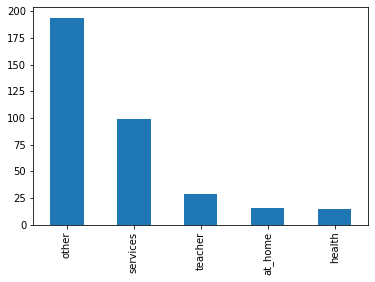

In [33]:
# Изучим данные в столбце fjob — работа отца ('teacher' - учитель, 'health' - сфера здравоохранения, 'services' - гос служба, 'at_home' - не работает, 'other' - другое)
data.fjob.value_counts().plot.bar()
display(data.fjob.value_counts())
display(data.fjob.describe())

Отцы большинства учеников работают в профессиях, не определенных в датасете. Далее, второй по распространенности является работа в гос.секторе. Среди отцов значительно менее популярны профессии связанные с образованием и медициной. Также, значительно меньше чем у матерей, среди отцов распространено значение "не работает". К сожалению, в столбце есть пропуски. Заполним пропуски наиболее часто встречающимся значением - в данном случае значением 'other'.

In [34]:
fill_max_count_val('fjob')
display(data.fjob.value_counts())
display(data.fjob.describe())

other       230
services     99
teacher      29
at_home      16
health       15
Name: fjob, dtype: int64

count       389
unique        5
top       other
freq        230
Name: fjob, dtype: object

Пустые значения в столбце fjob - отсутствуют.

course        135
reputation    102
home          101
other          34
Name: reason, dtype: int64

count        372
unique         4
top       course
freq         135
Name: reason, dtype: object

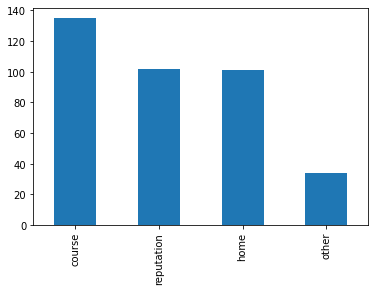

In [35]:
# Изучим данные в столбце reason — причина выбора школы ('home' - близость к дому, 'reputation' - репутация школы, 'course' - образовательная программа, 'other' - другое)
data.reason.value_counts().plot.bar()
display(data.reason.value_counts())
display(data.reason.describe())

Чаще всего школу выбирают, руководствуясь образовательной программой. К сожалению, в столбце есть пропуски. 
Выбор школы это субъективное решение. Для мнений, не определенных точно в данном столбце есть значние 'other'.
Заполним пропуски этим значением.

In [36]:
fill_other('reason')
display(data.reason.value_counts())
display(data.reason.describe())

course        135
reputation    102
home          101
other          51
Name: reason, dtype: int64

count        389
unique         4
top       course
freq         135
Name: reason, dtype: object

Пустые значения в столбце reason - отсутствуют.

mother    248
father     86
other      24
Name: guardian, dtype: int64

count        358
unique         3
top       mother
freq         248
Name: guardian, dtype: object

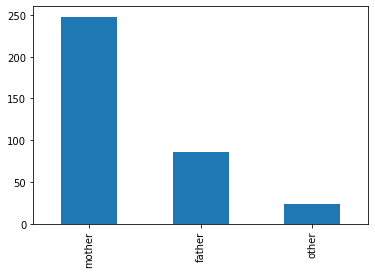

In [37]:
# Изучим данные в столбце guardian — опекун ('mother' - мать, 'father' - отец, 'other' - другое)
data.guardian.value_counts().plot.bar()
display(data.guardian.value_counts())
display(data.guardian.describe())

Чаще всего опекуном ученика является мама. Однако, в этом столбце есть пустые значения. Для случаев, не определенных точно в данном столбце есть значние 'other'. Заполним пропуски этим значением.

In [38]:
fill_other('guardian')
display(data.guardian.value_counts())
display(data.guardian.describe())

mother    248
father     86
other      55
Name: guardian, dtype: int64

count        389
unique         3
top       mother
freq         248
Name: guardian, dtype: object

Пустые значения в столбце guardian - отсутствуют.

2.0    189
1.0    103
3.0     63
4.0     27
Name: studytime, dtype: int64

count    382.000000
mean       2.036649
std        0.847239
min        1.000000
25%        1.000000
50%        2.000000
75%        2.000000
max        4.000000
Name: studytime, dtype: float64

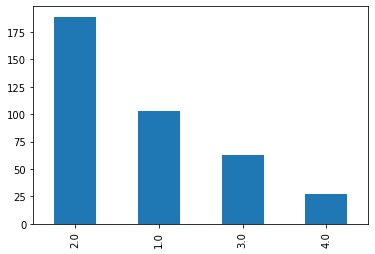

In [39]:
# Изучим данные в столбце studytime — время на учёбу помимо школы в неделю (1 - <2 часов, 2 - 2-5 часов, 3 - 5-10 часов, 4 - >10 часов)
data.studytime.value_counts().plot.bar()
display(data.studytime.value_counts())
display(data.studytime.describe())

Большинство учеников, отводят от 2 до 5 часов времени на учебу помимо школы. К сожалению, в столбце есть пропуски, хотя их и немного. Заполним пропуски наиболее часто встречающимся значением - в данном случае значением 2.

In [40]:
fill_max_count_val('studytime')
display(data.studytime.value_counts())
display(data.studytime.describe())

2.0    196
1.0    103
3.0     63
4.0     27
Name: studytime, dtype: int64

count    389.000000
mean       2.035990
std        0.839575
min        1.000000
25%        1.000000
50%        2.000000
75%        2.000000
max        4.000000
Name: studytime, dtype: float64

Пустые значения в столбце studytime - отсутствуют.

0.0    290
1.0     48
2.0     15
3.0     14
Name: failures, dtype: int64

count    367.000000
mean       0.326975
std        0.729479
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        3.000000
Name: failures, dtype: float64

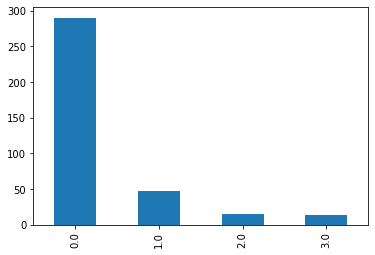

In [41]:
# Изучим данные в столбце failures — количество внеучебных неудач (n, если 1<=n<=3, иначе 0).
data.failures.value_counts().plot.bar()
display(data.failures.value_counts())
display(data.failures.describe())

Этот столбец пока не очень понятент, но удалять его не стоит, т.к. он может содержать важную информацию, влияющую на поведение модели. Большая часть данных имеет значение 0 (количество внеучебных неудач - 0 или более 3). В столбце есть пропуски. Заполним пропуски наиболее часто встречающимся значением - в данном случае значением 0.

In [42]:
fill_max_count_val('failures')
display(data.failures.value_counts())
display(data.failures.describe())

0.0    312
1.0     48
2.0     15
3.0     14
Name: failures, dtype: int64

count    389.000000
mean       0.308483
std        0.712521
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        3.000000
Name: failures, dtype: float64

Пустые значения в столбце failures - отсутствуют.

Для всех столбцов с булевыми значениями используем функцию проверки на пропуски и некорректные значения.

In [43]:
for col in ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    check_bool(col)

****** Столбец schoolsup  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


no     331
yes     49
Name: schoolsup, dtype: int64

count     380
unique      2
top        no
freq      331
Name: schoolsup, dtype: object

****** Столбец famsup  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


yes    216
no     135
Name: famsup, dtype: int64

count     351
unique      2
top       yes
freq      216
Name: famsup, dtype: object

****** Столбец paid  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


no     197
yes    153
Name: paid, dtype: int64

count     350
unique      2
top        no
freq      197
Name: paid, dtype: object

****** Столбец activities  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


yes    192
no     183
Name: activities, dtype: int64

count     375
unique      2
top       yes
freq      192
Name: activities, dtype: object

****** Столбец nursery  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


yes    297
no      77
Name: nursery, dtype: int64

count     374
unique      2
top       yes
freq      297
Name: nursery, dtype: object

****** Столбец higher  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


yes    350
no      19
Name: higher, dtype: int64

count     369
unique      2
top       yes
freq      350
Name: higher, dtype: object

****** Столбец internet  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


yes    300
no      55
Name: internet, dtype: int64

count     355
unique      2
top       yes
freq      300
Name: internet, dtype: object

****** Столбец romantic  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


no     235
yes    123
Name: romantic, dtype: int64

count     358
unique      2
top        no
freq      235
Name: romantic, dtype: object

In [44]:
# Т.к. в каждом столбце обнаружились пропуски - заполним их наиболее часто встречающимся значением соответствующего столбца.
for col in ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    fill_max_count_val(col)

In [45]:
# Проверим столбцы еще раз.
for col in ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    check_bool(col)

****** Столбец schoolsup  ******


no     340
yes     49
Name: schoolsup, dtype: int64

count     389
unique      2
top        no
freq      340
Name: schoolsup, dtype: object

****** Столбец famsup  ******


yes    254
no     135
Name: famsup, dtype: int64

count     389
unique      2
top       yes
freq      254
Name: famsup, dtype: object

****** Столбец paid  ******


no     236
yes    153
Name: paid, dtype: int64

count     389
unique      2
top        no
freq      236
Name: paid, dtype: object

****** Столбец activities  ******


yes    206
no     183
Name: activities, dtype: int64

count     389
unique      2
top       yes
freq      206
Name: activities, dtype: object

****** Столбец nursery  ******


yes    312
no      77
Name: nursery, dtype: int64

count     389
unique      2
top       yes
freq      312
Name: nursery, dtype: object

****** Столбец higher  ******


yes    370
no      19
Name: higher, dtype: int64

count     389
unique      2
top       yes
freq      370
Name: higher, dtype: object

****** Столбец internet  ******


yes    334
no      55
Name: internet, dtype: int64

count     389
unique      2
top       yes
freq      334
Name: internet, dtype: object

****** Столбец romantic  ******


no     266
yes    123
Name: romantic, dtype: int64

count     389
unique      2
top        no
freq      266
Name: romantic, dtype: object

Столбцы schoolsup, famsup, paid, activities, nursery, higher, internet, romantic не содержат пропусков и некорректных значений.

Для всех столбцов с рейтингом от 1 до 5 используем функцию проверки на пропуски и некорректные значения.

In [46]:
for col in ['famrel', 'freetime', 'goout', 'health']:
    check_rating(col)

****** Столбец famrel  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


 4.0    178
 5.0     97
 3.0     62
 2.0     17
 1.0      7
-1.0      1
Name: famrel, dtype: int64

count    362.000000
mean       3.930939
std        0.931554
min       -1.000000
25%        4.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: famrel, dtype: float64

ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ НЕДОПУСТИМОЕ ЗНАЧЕНИЕ! -1.0 



****** Столбец freetime  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


3.0    152
4.0    110
2.0     63
5.0     37
1.0     18
Name: freetime, dtype: int64

count    380.000000
mean       3.223684
std        0.993364
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: freetime, dtype: float64

****** Столбец goout  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


3.0    126
2.0    101
4.0     81
5.0     51
1.0     23
Name: goout, dtype: int64

count    382.000000
mean       3.094241
std        1.116104
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: goout, dtype: float64

****** Столбец health  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


5.0    137
3.0     88
4.0     60
1.0     47
2.0     42
Name: health, dtype: int64

count    374.000000
mean       3.529412
std        1.402006
min        1.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: health, dtype: float64

Оказалось, что все столбцы содержат пропуски, а столбец famrel содержит еще и некорректное значение, которое выходит за границы допустимого диапазона (ошибочное значение: -1). Скорее всего это опечатка, поэтому исправим его, убрав минус.

In [47]:
# Исправим опечатку. Пройдемся функцией, возвращающей модуль значения для всех строк столбца.
data.famrel = data.famrel.apply(lambda x: abs(x))
check_rating('famrel')

****** Столбец famrel  ******
ВНИМАНИЕ! В СТОЛБЦЕ ЕСТЬ ПРОПУСКИ!


4.0    178
5.0     97
3.0     62
2.0     17
1.0      8
Name: famrel, dtype: int64

count    362.000000
mean       3.936464
std        0.907858
min        1.000000
25%        4.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: famrel, dtype: float64

In [48]:
# Т.к. в каждом столбце обнаружились пропуски - заполним их наиболее часто встречающимся значением соответствующего столбца.
for col in ['famrel', 'freetime', 'goout', 'health']:
    fill_max_count_val(col)

In [49]:
# Проверим столбцы еще раз.
for col in ['famrel', 'freetime', 'goout', 'health']:
    check_rating(col)

****** Столбец famrel  ******


4.0    205
5.0     97
3.0     62
2.0     17
1.0      8
Name: famrel, dtype: int64

count    389.000000
mean       3.940874
std        0.875850
min        1.000000
25%        4.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: famrel, dtype: float64

****** Столбец freetime  ******


3.0    161
4.0    110
2.0     63
5.0     37
1.0     18
Name: freetime, dtype: int64

count    389.000000
mean       3.218509
std        0.982353
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: freetime, dtype: float64

****** Столбец goout  ******


3.0    133
2.0    101
4.0     81
5.0     51
1.0     23
Name: goout, dtype: int64

count    389.000000
mean       3.092545
std        1.106062
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: goout, dtype: float64

****** Столбец health  ******


5.0    152
3.0     88
4.0     60
1.0     47
2.0     42
Name: health, dtype: int64

count    389.000000
mean       3.586118
std        1.403572
min        1.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: health, dtype: float64

Столбцы famrel, freetime, goout, health не содержат пропусков и некорректных значений.

count    378.000000
mean       7.320106
std       23.615525
min        0.000000
25%        0.000000
50%        4.000000
75%        8.000000
max      385.000000
Name: absences, dtype: float64

0.0      110
2.0       60
4.0       52
6.0       30
8.0       20
10.0      17
12.0      12
14.0      12
3.0        7
16.0       7
7.0        6
5.0        5
18.0       5
20.0       4
22.0       3
9.0        3
1.0        3
15.0       2
13.0       2
11.0       2
25.0       1
54.0       1
385.0      1
26.0       1
56.0       1
24.0       1
212.0      1
21.0       1
75.0       1
30.0       1
19.0       1
38.0       1
40.0       1
23.0       1
17.0       1
28.0       1
Name: absences, dtype: int64

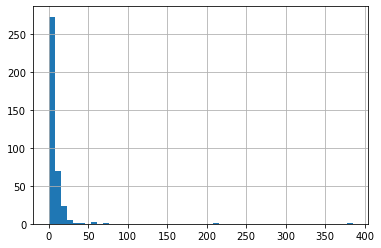

In [50]:
# Изучим столбец absences — количество пропущенных занятий.
# Посмотрим гистограму распределения, для визуального контроля данных, а также основные статистические параметры.
data.absences.hist(bins=50)
display(data.absences.describe())
display(data.absences.value_counts())

В столбце absences есть пропущенные значения, которые лучше заполнить средним значением. Однако, в данных есть экстремальные значения (например 385, 212). Удалять эти значения нежелательно, т.к. они входят в диапазон возможных значений, однако мы не будем учитывать эти экстремумы при заполнении пустых значений.
Используя формулу интерквартильного расстояния избавимся от выбросов и найдем скорректированное среднее значение количества пропущенных уроков. После чего, заменим пропущенные значения найденным скоректированным средним.

In [51]:
IQR = data.absences.quantile(0.75) - data.absences.quantile(0.25)
perc25 = data.absences.quantile(0.25)
perc75 = data.absences.quantile(0.75)
# Находим среднее значение absences с учетом экстремальных значений, округлив до целого.
correct_mean = round(data.absences.loc[data.absences.between(
    perc25 - 1.5*IQR, perc75 + 1.5*IQR)].mean())

for x in range(0, len(data)):
    if pd.isnull(data['absences'].iloc[x]):
        data['absences'].iloc[x] = correct_mean

display(data.absences.describe())

count    389.000000
mean       7.254499
std       23.281547
min        0.000000
25%        0.000000
50%        4.000000
75%        8.000000
max      385.000000
Name: absences, dtype: float64

<AxesSubplot:>

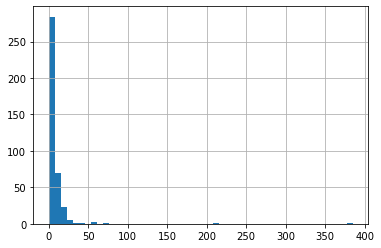

In [52]:
data.absences.hist(bins=50)

In [53]:
# Повторно проверим наличие и количество пустых значений в каждом из столбцов
data.isna().sum()

school        0
sex           0
age           0
address       0
famsize       0
pstatus       0
medu          0
fedu          0
mjob          0
fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
health        0
absences      0
score         0
dtype: int64

Мы избавились от пустых и некорректных значений, от ошибок в данных.
Теперь изучим, какие столбцы коррелируют с баллами по математике.

In [54]:
pandas_profiling.ProfileReport(data)

In [55]:
data.corr()

,age,medu,fedu,traveltime,studytime,failures,famrel,freetime,goout,health,absences,score
age,1.000000,-0.145755,-0.126522,0.059377,-0.018019,0.206279,0.056941,0.013994,0.121057,-0.061752,0.095541,-0.155726
medu,-0.145755,1.000000,0.254268,-0.166045,0.076035,-0.238295,-0.003073,0.040743,0.070310,-0.070420,-0.014135,0.200890
fedu,-0.126522,0.254268,1.000000,0.031669,0.054663,-0.145649,0.043992,-0.063931,-0.019476,0.004875,0.004055,0.075273
traveltime,0.059377,-0.166045,0.031669,1.000000,-0.103473,0.065124,-0.019281,-0.044212,0.013900,0.032268,-0.055380,-0.094221
studytime,-0.018019,0.076035,0.054663,-0.103473,1.000000,-0.169399,0.037950,-0.122057,-0.053554,-0.063876,-0.024995,0.114295
failures,0.206279,-0.238295,-0.145649,0.065124,-0.169399,1.000000,-0.028517,0.087558,0.101036,0.079030,0.057247,-0.337187
famrel,0.056941,-0.003073,0.043992,-0.019281,0.037950,-0.028517,1.000000,0.164830,0.069514,0.093256,-0.080152,0.052902
freetime,0.013994,0.040743,-0.063931,-0.044212,-0.122057,0.087558,0.164830,1.000000,0.294450,0.067629,0.008381,0.017481
goout,0.121057,0.070310,-0.019476,0.013900,-0.053554,0.101036,0.069514,0.294450,1.000000,-0.015108,-0.048158,-0.127742
health,-0.061752,-0.070420,0.004875,0.032268,-0.063876,0.079030,0.093256,0.067629,-0.015108,1.000000,-0.020982,-0.080583


Изучив таблицу корреляций, мы видим, что наиболее сильно с баллами по математике коррелируется солбец failures — количество внеучебных неудач. При этом мы наблюдаем отрицательную корреляцию. Кроме того, определенная корреляция наблюдается с образованием матери - medu. Эти переменные далее можно проанализировать и как категориальные.
Из числовых переменных мы также наблюдаем незначительную отрицательную корреляцию между возрастом и целевой переменной score.

Далее проведем анализ категориальных и булевых переменных. Для этого построим boxplot и проверим, есть ли статистическая разница в распределении оценок по номинативным признакам, с помощью теста Стьюдента.

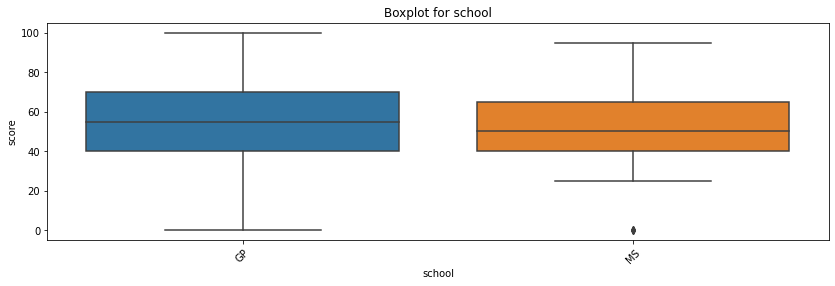

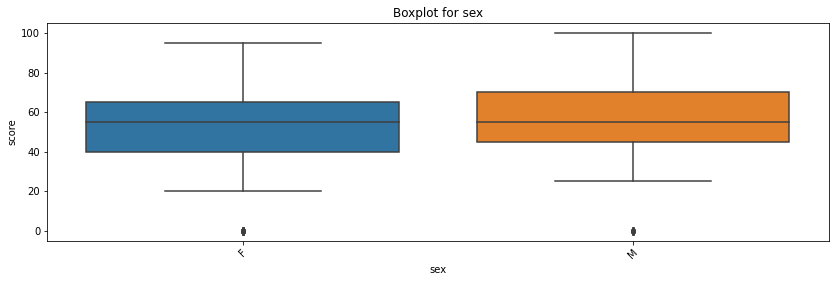

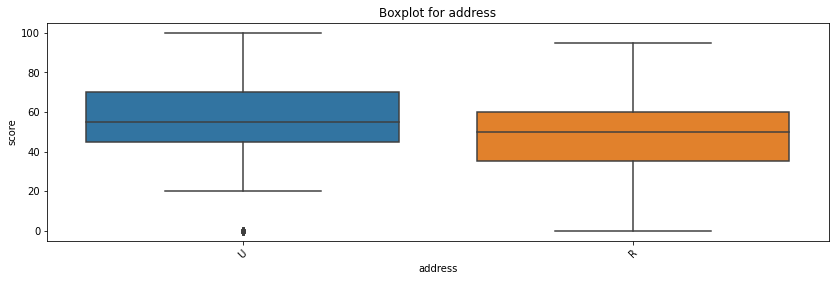

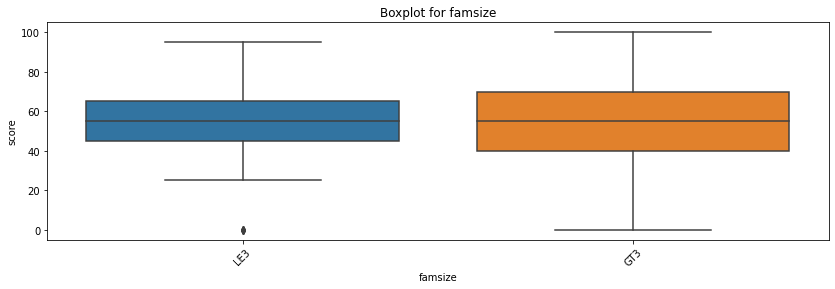

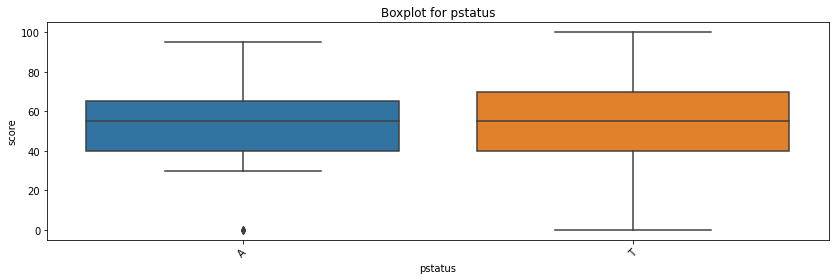

...

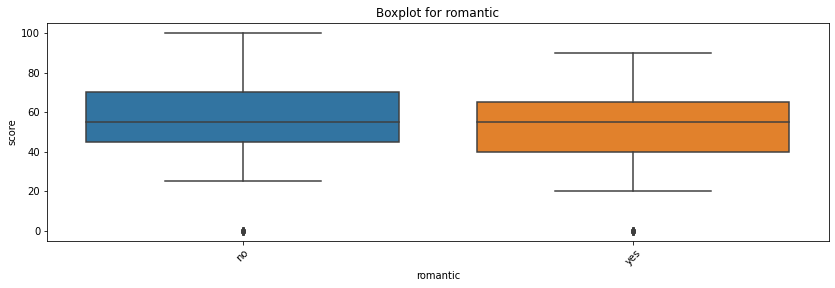

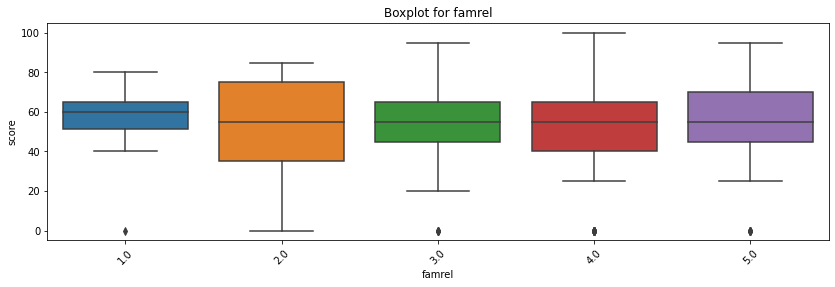

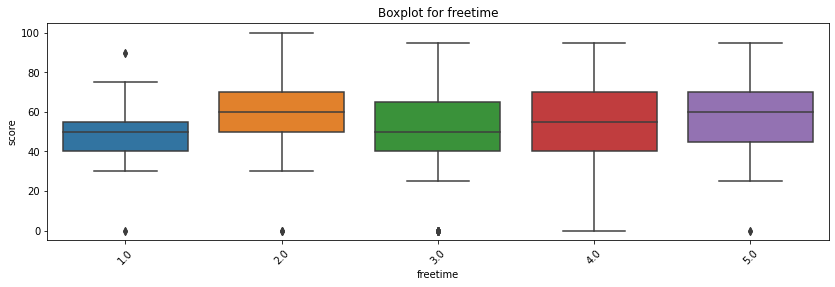

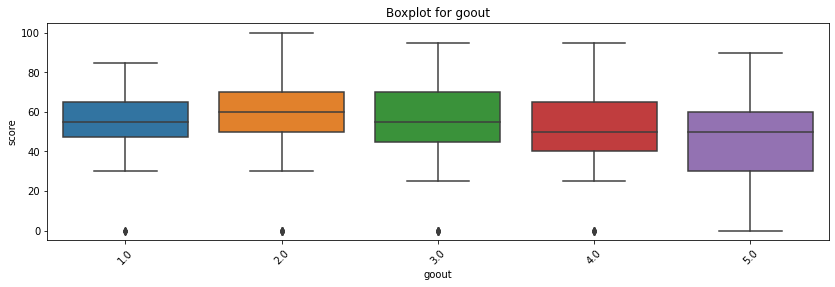

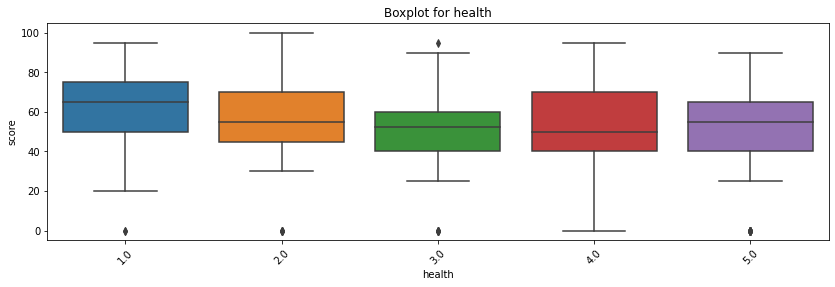

In [56]:
for col in ['school', 'sex', 'address', 'famsize', 'pstatus', 'medu', 'fedu', 'mjob', 'fjob', 'reason', 'guardian', 'traveltime', 'studytime', 'failures',
            'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'health']:
    get_boxplot(col)

In [57]:
for col in ['school', 'sex', 'address', 'famsize', 'pstatus', 'medu', 'fedu', 'mjob', 'fjob', 'reason', 'guardian', 'traveltime', 'studytime', 'failures',
            'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'health']:
    get_stat_dif(col)

Найдены статистически значимые различия для колонки address
Найдены статистически значимые различия для колонки medu
Найдены статистически значимые различия для колонки mjob
Найдены статистически значимые различия для колонки failures
Найдены статистически значимые различия для колонки higher
Найдены статистически значимые различия для колонки romantic


## Выводы
- Подтвердилось наше предположение по поводу влияния на целевую переменную данных из столбцов failures и medu. 
- Кроме того, серьёзно отличаются параметры: address, mjob, higher, romantic. 
- Из числовых данных, наблюдается определенная корреляция успеваемости с возрастом учащихся.
- Судя по данным, на успеваемость ученика мать оказывает гораздо большее влияние, чем отец. 
- При этом, если ученик стремится в дальнейшем получить высшее образование - он в целом более успешен в тестах по математике.
- Количество внеучебных неудач достаточно сильно влияет на успешность ученика. Чем больше таких неудач - тем ниже оценка в тесте по математике. 
- Также, на успеваемость некоторое влияние оказывает проживание ученика (в городе или за его чертой), а также, отвлекают ли ученика романтические отношения или нет (если отвлекают - успеваемость хуже).

Данные в целом более менее качественные, ошибок не много (в большинстве своем - опечатки). Есть экстремальные значения, но они входят в диапазон допустимых значений. Практически во всех столбцах наблюдались пропущенные значения, но их доля была не очень большой по сравнению с заполненными.

Самые важные параметры, которые предлагается использовать в дальнейшем для построения модели: age, address, medu, mjob, failures, higher, romantic.

In [58]:
data_for_model = data.loc[:, ['age', 'address',
                              'medu', 'mjob', 'failures', 'higher', 'romantic']]
data_for_model.sample(10)

,age,address,medu,mjob,failures,higher,romantic
391,17,U,3.0,services,0.0,yes,no
151,16,U,2.0,at_home,1.0,yes,yes
105,15,U,3.0,other,0.0,yes,no
271,18,U,2.0,other,0.0,yes,yes
250,18,U,3.0,services,1.0,yes,no
70,16,U,3.0,other,0.0,yes,no
84,15,U,1.0,other,0.0,yes,no
36,15,U,4.0,teacher,0.0,yes,no
33,15,U,3.0,other,0.0,yes,no
193,16,R,4.0,services,0.0,yes,no
